#### Parte 1 - EP2

#### EP2 MAC0417 / MAC5768

#### Nome: Celestino Paulo Tchipongue Kalueyo

#### NUSP:11873374

#### Turma: MAC0417 / MAC5768

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os
from skimage.transform import resize

# Metadatos

In [14]:
metadata = pd.read_csv("./metadados.csv")

In [15]:
metadata

,Objectos,Nome_imagem,1ªclasse,2ªclasse,3ªclasse,4ªclasse,Plano de fundo,Luz
0,"Rp, Re, O, E",001.jpeg,Repelente,Relógio,Óculos,Escova,Taco,Escuro
1,"E, Re, O, Rp",002.jpeg,Escova,Relógio,Óculos,Repelente,Taco,Quente
2,"O, Rp, E, Re",003.jpeg,Óculos,Repelente,Escova,Relógio,Taco,Neutra
3,"Re, Rp, E, O",004.jpeg,Relógio,Repelente,Escova,Óculos,Taco,Escuro
4,"T, G, C, Cl",005.jpeg,Termómetro,Grampiador,Caneta,Calculadora,Taco,Escuro
...,...,...,...,...,...,...,...,...
195,"Cl, C, Re, G",196.jpeg,Calculadora,Caneta,Relógio,Grampiador,Madeira,Quente
196,"G, C, Re, Cl",197.jpeg,Grampiador,Caneta,Relógio,Calculadora,Madeira,Neutra
197,"G, C, Re, Cl",198.jpeg,Grampiador,Caneta,Relógio,Calculadora,Madeira,Claro
198,"Re, Ch, G, C",199.jpeg,Relógio,Chave de fenda,Grampiador,Caneta,Madeira,Claro


# Contagem das imagens por categorias (Luz)

In [18]:
#Função de contagem da quantidade de imagens por categoria (Luz)
def count_images_per_light(df):
  
  light_counts = {}
  for light in df["Luz"].unique():
    light_counts[light] = len(df[df["Luz"] == light])
  return light_counts

images_per_light = count_images_per_light(metadata)
#print(images_per_light)
escuro = metadata[metadata['Luz'] == 'Escuro']['Nome_imagem']
quente = metadata[metadata['Luz'] == 'Quente']['Nome_imagem']
neutra = metadata[metadata['Luz'] == 'Neutra']['Nome_imagem']
claro = metadata[metadata['Luz'] == 'Claro']['Nome_imagem']
print('Número por iluminação')
print(images_per_light)
print('*********************************************************')
print('*********************************************************')
print(f'Escuro: {escuro.to_list()}')
print(f'Quente: {quente.to_list()}')
print(f'Neutra: {neutra.to_list()}')
print(f'Claro: {claro.to_list()}')

Número por iluminação
{'Escuro': 55, 'Quente': 50, 'Neutra': 47, 'Claro': 48}
*********************************************************
*********************************************************
Escuro: ['001.jpeg', '004.jpeg', '005.jpeg', '009.jpeg', '010.jpeg', '011.jpeg', '017.jpeg', '024.jpeg', '029.jpeg', '034.jpeg', '038.jpeg', '040.jpeg', '044.jpeg', '045.jpeg', '051.jpeg', '053.jpeg', '054.jpeg', '068.jpeg', '074.jpeg', '079.jpeg', '083.jpeg', '088.jpeg', '093.jpeg', '097.jpeg', '099.jpeg', '100.jpeg', '102.jpeg', '103.jpeg', '106.jpeg', '107.jpeg', '112.jpeg', '113.jpeg', '117.jpeg', '118.jpeg', '123.jpeg', '124.jpeg', '125.jpeg', '128.jpeg', '134.jpeg', '138.jpeg', '149.jpeg', '150.jpeg', '154.jpeg', '157.jpeg', '161.jpeg', '167.jpeg', '173.jpeg', '174.jpeg', '175.jpeg', '182.jpeg', '188.jpeg', '189.jpeg', '190.jpeg', '193.jpeg', '200.jpeg']
Quente: ['002.jpeg', '008.jpeg', '014.jpeg', '018.jpeg', '030.jpeg', '031.jpeg', '035.jpeg', '036.jpeg', '048.jpeg', '049.jpeg', '055.jpe

# Redimensionamento

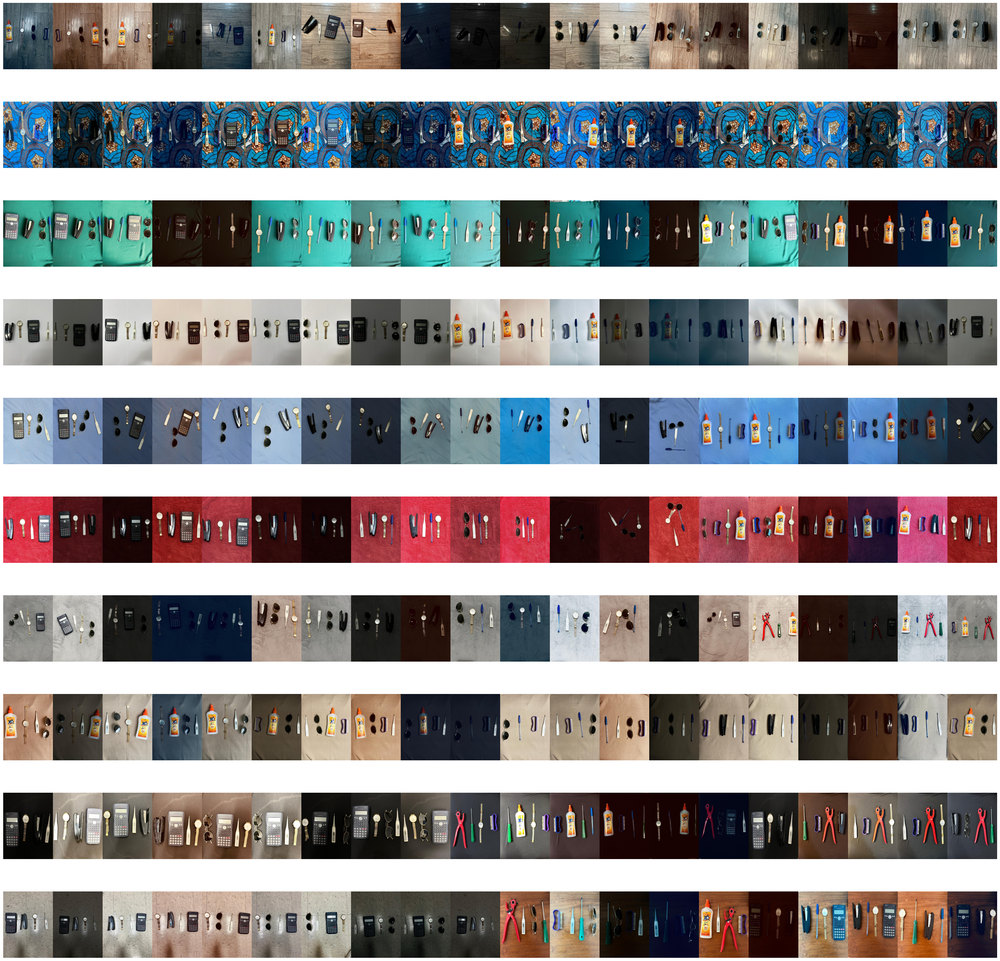

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import os
from skimage.transform import resize

# Caminho para a pasta com as imagens
pasta_imagens = './geral'

# Caminho para a pasta onde as imagens redimensionadas serão salvas
pasta_saida = './redimensionadas'

os.makedirs(pasta_saida, exist_ok=True)

# Lista de arquivos de imagem na pasta
arquivos_imagens = [f for f in os.listdir(pasta_imagens) if os.path.isfile(os.path.join(pasta_imagens, f))]

# Número de imagens a ser plotado
num_imagens = 200  

# Tamanho para redimensionar as imagens
tamanho_novo = (800, 600)  

# Função para carregar e redimensionar imagens
def carregar_e_redimensionar_imagens(pasta, arquivos, tamanho):
    imagens = []
    for arquivo in arquivos[:num_imagens]:
        caminho_completo = os.path.join(pasta, arquivo)
        img = mpimg.imread(caminho_completo)
        if img.shape[2] == 4:  # Se a imagem tiver um canal alfa
            img = img[:, :, :3]  # Descartar o canal alfa
        img_resized = resize(img, tamanho, anti_aliasing=True)
        imagens.append((img_resized, arquivo))
    return imagens

# Carregar e redimensionar as imagens
imagens = carregar_e_redimensionar_imagens(pasta_imagens, arquivos_imagens, tamanho_novo)

# Salvar as imagens redimensionadas na pasta de saída
for img, nome in imagens:
    caminho_saida = os.path.join(pasta_saida, nome)
    mpimg.imsave(caminho_saida, img)

# Função para plotar imagens lado a lado, 20 por linha
def plotar_imagens(imagens, imagens_por_linha=20):
    num_linhas = (len(imagens) + imagens_por_linha - 1) // imagens_por_linha
    fig, axes = plt.subplots(num_linhas, imagens_por_linha, figsize=(40, 40))
    for i, ax in enumerate(axes.flat):
        if i < len(imagens):
            ax.imshow(imagens[i][0])
        ax.axis('off')
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

# Plotar as imagens
plotar_imagens(imagens, imagens_por_linha=20)



# Converter as imagens de RGB para cinza

In [4]:
import cv2
import os
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

In [16]:
# Caminho para a pasta com as imagens
pasta_imagens = './redimensionadas'

# Lista de arquivos de imagem na pasta
arquivos_imagens = [f for f in os.listdir(pasta_imagens) if os.path.isfile(os.path.join(pasta_imagens, f))]

# Caminho para a pasta onde as imagens convertidas estão salvas
pasta_saida = './originalGrayDataset'

os.makedirs(pasta_saida, exist_ok=True)

# Coeficientes para a conversão RGB para escala de cinza
rgb_gray = [0.2989, 0.5870, 0.1140]

# Função para converter imagens para escala de cinza e salvar
def converter_para_cinza_numpy(pasta, arquivos, pasta_saida):
    for arquivo in arquivos:
        caminho_completo = os.path.join(pasta, arquivo)
        img = mpimg.imread(caminho_completo)
        if img is not None:
            img_gray = np.dot(img[...,:3], rgb_gray)
            caminho_saida = os.path.join(pasta_saida, arquivo)
            plt.imsave(caminho_saida, img_gray, cmap='gray')

# Converter e salvar as imagens
converter_para_cinza_numpy(pasta_imagens, arquivos_imagens, pasta_saida)

print("Conversão para escala de cinza concluída.")

Conversão para escala de cinza concluída.


# Contrast Stretching;

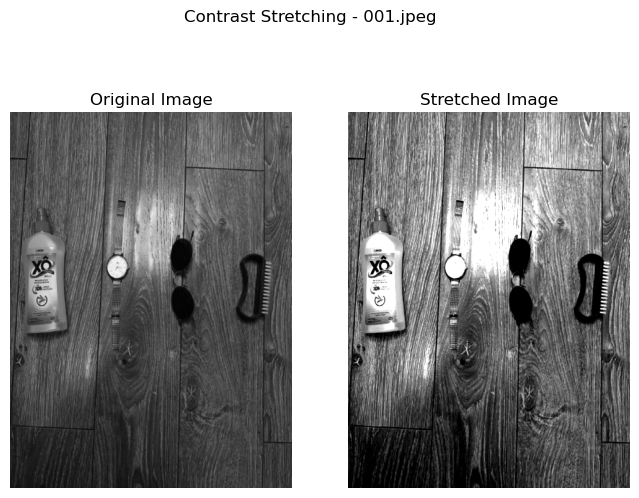

In [11]:
# Bibliotecas
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def contrast_stretching(image, lower_percentile=5, upper_percentile=95):
    if image is None:
        raise ValueError("Imagem não pode ser None. Verifique o caminho da imagem.")
    
    # Calcula os percentis 5% e 95%
    I_min = np.percentile(image, lower_percentile)  # Percentagem mínima
    I_max = np.percentile(image, upper_percentile)  # Percentagem máxima

    # Aplica a fórmula de contrast stretching
    stretched_image = (image - I_min) * 255 / (I_max - I_min)
    stretched_image = np.clip(stretched_image, 0, 255).astype(np.uint8)

    return stretched_image

def process_images_in_folder(folder_path, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Processar apenas a primeira imagem encontrada
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            image_path = os.path.join(folder_path, filename)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            if image is not None:
                stretched_image = contrast_stretching(image)
                
                # Salva a imagem processada
                output_path = os.path.join(output_folder, filename)
                cv2.imwrite(output_path, stretched_image)
                
                # Plota a imagem original e a imagem processada
                plt.figure(figsize=(8, 6))

                plt.subplot(1, 2, 1)
                plt.imshow(image, cmap='gray')
                plt.title('Original Image')
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.imshow(stretched_image, cmap='gray')
                plt.title('Stretched Image')
                plt.axis('off')

                plt.suptitle(f'Contrast Stretching - {filename}')
                plt.show()

                # Interrompe o loop após a primeira imagem
                break
            else:
                print(f"Falha ao carregar a imagem: {image_path}")

# Caminho da pasta com as imagens em cinza
folder_path = './originalGrayDataset' #pasta com as imagens originais (em cinza)
# Caminho da pasta para salvar as imagens processadas
output_folder = './augmentedDataset/Contrast_Stretching'

# Processa as imagens na pasta
process_images_in_folder(folder_path, output_folder)


# Laplacian

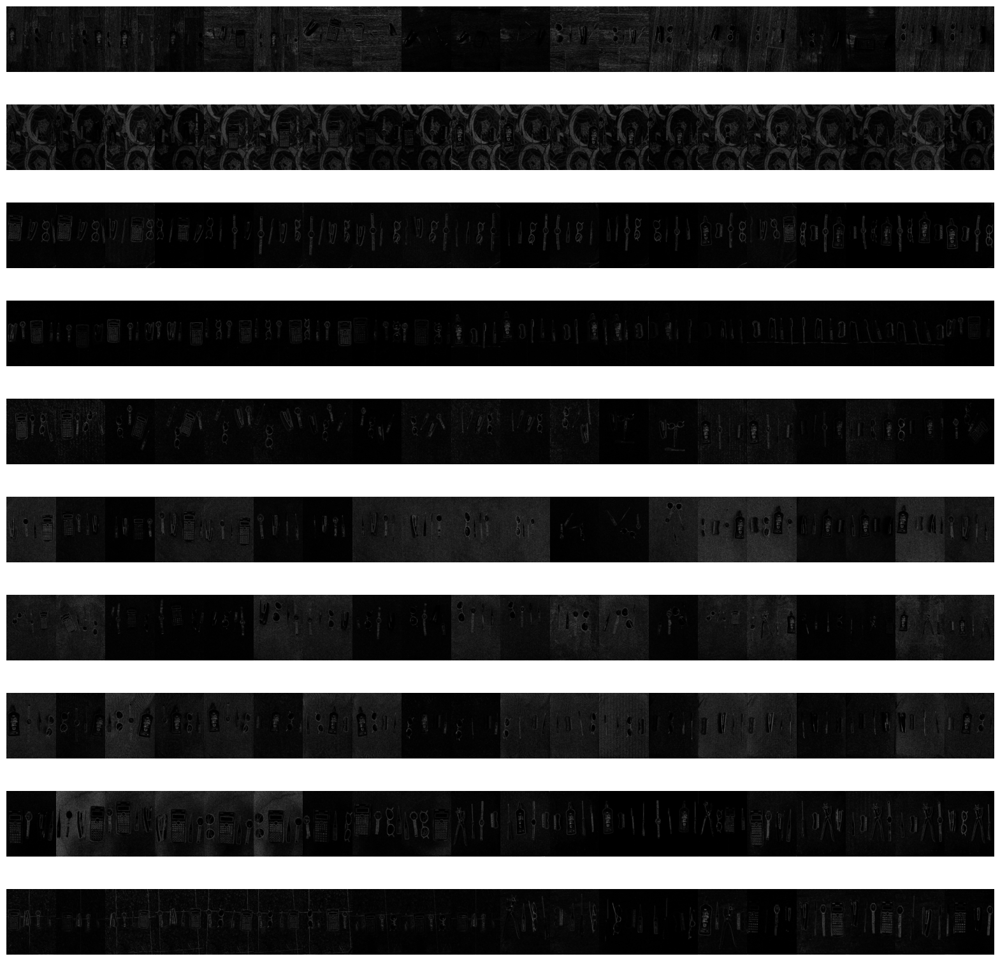

Imagens processadas e salvas em: ./augmentedDataset/Laplaciano


In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Caminho para a pasta com as imagens
pasta_imagens = './originalGrayDataset'

# Caminho para a pasta onde as imagens processadas serão salvas
pasta_saida = './augmentedDataset/Laplaciano'
os.makedirs(pasta_saida, exist_ok=True)

# Lista de arquivos de imagem na pasta
arquivos_imagens = [f for f in os.listdir(pasta_imagens) if os.path.isfile(os.path.join(pasta_imagens, f))]

# Função para carregar e aplicar o operador laplaciano nas imagens
def aplicar_laplaciano(pasta, arquivos):
    imagens_processadas = []
    for arquivo in arquivos:
        caminho_completo = os.path.join(pasta, arquivo)
        # Carregar a imagem em escala de cinza
        img = cv2.imread(caminho_completo, cv2.IMREAD_GRAYSCALE)
        # Aplicar o filtro laplaciano manualmente com uma máscara
        kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]], dtype=np.float32)
        laplaciano = cv2.filter2D(img, cv2.CV_64F, kernel)
        laplaciano = cv2.convertScaleAbs(laplaciano)
        imagens_processadas.append((laplaciano, arquivo))
    return imagens_processadas

# Aplicar o operador laplaciano nas imagens
imagens_processadas = aplicar_laplaciano(pasta_imagens, arquivos_imagens)

# Salvar as imagens processadas na pasta de saída
for img, nome in imagens_processadas:
    caminho_saida = os.path.join(pasta_saida, nome)
    cv2.imwrite(caminho_saida, img)

# Função para plotar imagens lado a lado, 10 por linha
def plotar_imagens(imagens, imagens_por_linha=20):
    num_linhas = (len(imagens) + imagens_por_linha - 1) // imagens_por_linha
    fig, axes = plt.subplots(num_linhas, imagens_por_linha, figsize=(20, 20))
    for i, ax in enumerate(axes.flat):
        if i < len(imagens):
            ax.imshow(imagens[i][0], cmap='gray')
        ax.axis('off')
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

# Plotar as imagens processadas
plotar_imagens(imagens_processadas, imagens_por_linha=20)

print("Imagens processadas e salvas em:", pasta_saida)


# logarithmic

In [ ]:
import cv2
import numpy as np
import os
import random
import matplotlib.pyplot as plt

# Definir listas de imagens e constantes de contraste
escuro = ['001.jpeg', '004.jpeg', '005.jpeg', '009.jpeg', '010.jpeg', '011.jpeg', '017.jpeg', '024.jpeg', '029.jpeg', '034.jpeg', '038.jpeg', '040.jpeg', '044.jpeg', '045.jpeg', '051.jpeg', '053.jpeg', '054.jpeg', '068.jpeg', '074.jpeg', '079.jpeg', '083.jpeg', '088.jpeg', '093.jpeg', '097.jpeg', '099.jpeg', '100.jpeg', '102.jpeg', '103.jpeg', '106.jpeg', '107.jpeg', '112.jpeg', '113.jpeg', '117.jpeg', '118.jpeg', '123.jpeg', '124.jpeg', '125.jpeg', '128.jpeg', '134.jpeg', '138.jpeg', '149.jpeg', '150.jpeg', '154.jpeg', '157.jpeg', '161.jpeg', '167.jpeg', '173.jpeg', '174.jpeg', '175.jpeg', '182.jpeg', '188.jpeg', '189.jpeg', '190.jpeg', '193.jpeg', '200.jpeg']
quente = ['002.jpeg', '008.jpeg', '014.jpeg', '018.jpeg', '030.jpeg', '031.jpeg', '035.jpeg', '036.jpeg', '048.jpeg', '049.jpeg', '055.jpeg', '057.jpeg', '058.jpeg', '059.jpeg', '060.jpeg', '064.jpeg', '065.jpeg', '071.jpeg', '077.jpeg', '078.jpeg', '084.jpeg', '089.jpeg', '090.jpeg', '101.jpeg', '104.jpeg', '109.jpeg', '111.jpeg', '114.jpeg', '116.jpeg', '120.jpeg', '129.jpeg', '131.jpeg', '133.jpeg', '135.jpeg', '137.jpeg', '141.jpeg', '144.jpeg', '148.jpeg', '153.jpeg', '158.jpeg', '160.jpeg', '164.jpeg', '165.jpeg', '177.jpeg', '179.jpeg', '184.jpeg', '185.jpeg', '194.jpeg', '195.jpeg', '196.jpeg']
neutra = ['003.jpeg', '013.jpeg', '015.jpeg', '016.jpeg', '022.jpeg', '023.jpeg', '026.jpeg', '028.jpeg', '032.jpeg', '033.jpeg', '041.jpeg', '042.jpeg', '043.jpeg', '047.jpeg', '050.jpeg', '056.jpeg', '061.jpeg', '062.jpeg', '063.jpeg', '066.jpeg', '069.jpeg', '072.jpeg', '073.jpeg', '075.jpeg', '076.jpeg', '081.jpeg', '085.jpeg', '086.jpeg', '091.jpeg', '092.jpeg', '095.jpeg', '096.jpeg', '115.jpeg', '119.jpeg', '122.jpeg', '127.jpeg', '130.jpeg', '132.jpeg', '136.jpeg', '139.jpeg', '143.jpeg', '147.jpeg', '151.jpeg', '156.jpeg', '166.jpeg', '192.jpeg', '197.jpeg']
claro = ['006.jpeg', '007.jpeg', '012.jpeg', '019.jpeg', '020.jpeg', '021.jpeg', '025.jpeg', '027.jpeg', '037.jpeg', '039.jpeg', '046.jpeg', '052.jpeg', '067.jpeg', '070.jpeg', '080.jpeg', '082.jpeg', '087.jpeg', '094.jpeg', '098.jpeg', '105.jpeg', '108.jpeg', '110.jpeg', '121.jpeg', '126.jpeg', '140.jpeg', '142.jpeg', '145.jpeg', '146.jpeg', '152.jpeg', '155.jpeg', '159.jpeg', '162.jpeg', '163.jpeg', '168.jpeg', '169.jpeg', '170.jpeg', '171.jpeg', '172.jpeg', '176.jpeg', '178.jpeg', '180.jpeg', '181.jpeg', '183.jpeg', '186.jpeg', '187.jpeg', '191.jpeg', '198.jpeg', '199.jpeg']

#Constante c
constante = {
    "escuro": 25,
    "quente": 27,
    "neutra": 30,
    "claro": 18
}

# Definir diretórios 
input_dir = './originalGrayDataset'
output_dir = './augmentedDataset/Logaritmo' # Caminho para a pasta onde as imagens convertidas estão salvas

# Criar pasta de saída se não existir
os.makedirs(output_dir, exist_ok=True)

# Função para aplicar a transformação logarítmica
def log_transform(image, c):
    image_float = image.astype(float)
    transformed_image = c * np.log1p(image_float)
    transformed_image = np.clip(transformed_image, 0, 255)  # Garantir que os valores estejam no intervalo [0, 255]
    return transformed_image.astype(np.uint8)

# Função para plotar a imagem original e a transformada
def plot_images(original_image, transformed_image, image_name):
    plt.figure(figsize=(10, 5))

    # Plot original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title(f'Original - {image_name}')
    plt.axis('off')

    # Plot transformed image
    plt.subplot(1, 2, 2)
    plt.imshow(transformed_image, cmap='gray')
    plt.title(f'Transformada - {image_name}')
    plt.axis('off')

    plt.show()

# Processar imagens em cada lista
for lista, nome_lista in zip([escuro, quente, neutra, claro], ["escuro", "quente", "neutra", "claro"]):
    c = constante[nome_lista]
    for nome_imagem in lista:
        # Caminhos de entrada e saída
        input_path = os.path.join(input_dir, nome_imagem)
        output_path = os.path.join(output_dir, nome_imagem)

        # Carregar imagem
        image = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)
        if image is None:
            print(f"Erro ao carregar {input_path}. Pulando essa imagem.")
            continue

        # Aplicar transformação logarítmica
        transformed_image = log_transform(image, c)

        # Salvar imagem transformada
        cv2.imwrite(output_path, transformed_image)

        # Plotar uma imagem aleatória 
        if random.random() < 0.02: 
            plot_images(image, transformed_image, nome_imagem)

print("Transformação logarítmica concluída!")


# Exponential transformation

In [9]:
import cv2
import numpy as np
import os

# Listas de imagens
escuro = ['001.jpeg', '004.jpeg', '005.jpeg', '009.jpeg', '010.jpeg', '011.jpeg', '017.jpeg', '024.jpeg', '029.jpeg', '034.jpeg', '038.jpeg', '040.jpeg', '044.jpeg', '045.jpeg', '051.jpeg', '053.jpeg', '054.jpeg', '068.jpeg', '074.jpeg', '079.jpeg', '083.jpeg', '088.jpeg', '093.jpeg', '097.jpeg', '099.jpeg', '100.jpeg', '102.jpeg', '103.jpeg', '106.jpeg', '107.jpeg', '112.jpeg', '113.jpeg', '117.jpeg', '118.jpeg', '123.jpeg', '124.jpeg', '125.jpeg', '128.jpeg', '134.jpeg', '138.jpeg', '149.jpeg', '150.jpeg', '154.jpeg', '157.jpeg', '161.jpeg', '167.jpeg', '173.jpeg', '174.jpeg', '175.jpeg', '182.jpeg', '188.jpeg', '189.jpeg', '190.jpeg', '193.jpeg', '200.jpeg']
quente = ['002.jpeg', '008.jpeg', '014.jpeg', '018.jpeg', '030.jpeg', '031.jpeg', '035.jpeg', '036.jpeg', '048.jpeg', '049.jpeg', '055.jpeg', '057.jpeg', '058.jpeg', '059.jpeg', '060.jpeg', '064.jpeg', '065.jpeg', '071.jpeg', '077.jpeg', '078.jpeg', '084.jpeg', '089.jpeg', '090.jpeg', '101.jpeg', '104.jpeg', '109.jpeg', '111.jpeg', '114.jpeg', '116.jpeg', '120.jpeg', '129.jpeg', '131.jpeg', '133.jpeg', '135.jpeg', '137.jpeg', '141.jpeg', '144.jpeg', '148.jpeg', '153.jpeg', '158.jpeg', '160.jpeg', '164.jpeg', '165.jpeg', '177.jpeg', '179.jpeg', '184.jpeg', '185.jpeg', '194.jpeg', '195.jpeg', '196.jpeg']
neutra = ['003.jpeg', '013.jpeg', '015.jpeg', '016.jpeg', '022.jpeg', '023.jpeg', '026.jpeg', '028.jpeg', '032.jpeg', '033.jpeg', '041.jpeg', '042.jpeg', '043.jpeg', '047.jpeg', '050.jpeg', '056.jpeg', '061.jpeg', '062.jpeg', '063.jpeg', '066.jpeg', '069.jpeg', '072.jpeg', '073.jpeg', '075.jpeg', '076.jpeg', '081.jpeg', '085.jpeg', '086.jpeg', '091.jpeg', '092.jpeg', '095.jpeg', '096.jpeg', '115.jpeg', '119.jpeg', '122.jpeg', '127.jpeg', '130.jpeg', '132.jpeg', '136.jpeg', '139.jpeg', '143.jpeg', '147.jpeg', '151.jpeg', '156.jpeg', '166.jpeg', '192.jpeg', '197.jpeg']
claro = ['006.jpeg', '007.jpeg', '012.jpeg', '019.jpeg', '020.jpeg', '021.jpeg', '025.jpeg', '027.jpeg', '037.jpeg', '039.jpeg', '046.jpeg', '052.jpeg', '067.jpeg', '070.jpeg', '080.jpeg', '082.jpeg', '087.jpeg', '094.jpeg', '098.jpeg', '105.jpeg', '108.jpeg', '110.jpeg', '121.jpeg', '126.jpeg', '140.jpeg', '142.jpeg', '145.jpeg', '146.jpeg', '152.jpeg', '155.jpeg', '159.jpeg', '162.jpeg', '163.jpeg', '168.jpeg', '169.jpeg', '170.jpeg', '171.jpeg', '172.jpeg', '176.jpeg', '178.jpeg', '180.jpeg', '181.jpeg', '183.jpeg', '186.jpeg', '187.jpeg', '191.jpeg', '198.jpeg', '199.jpeg']

# Constantes c e valores de gamma
constante = {
    "escuro": 1,
    "quente": 1,
    "neutra": 1,
    "claro": 1
}

gammas = {
    "escuro": 0.5,
    "quente": 1.5,
    "neutra": 0.6,
    "claro": 0.4
}

# Função para aplicar a transformação exponencial
def apply_exponential_transform(image, c, gamma):
    # Convert image to float32
    image_float = image.astype(np.float32) / 255.0
    # Apply exponential transformation
    transformed_image = c * np.power(image_float, gamma)
    #Clip values to be in range [0, 1]
    transformed_image = np.clip(transformed_image, 0, 1)
    # Convert back to uint8
    transformed_image = (transformed_image * 255).astype(np.uint8)
    return transformed_image

# Diretório de entrada e saída
input_directory = './originalGrayDataset'
output_directory = './augmentedDataset/Exponencial_da_imagem' # Caminho para a pasta onde as imagens convertidas estão salvas

if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Processar imagens de cada lista
for category, image_list in zip(["escuro", "quente", "neutra", "claro"], [escuro, quente, neutra, claro]):
    c = constante[category]
    gamma = gammas[category]
    
    for filename in image_list:
        image_path = os.path.join(input_directory, filename)
        if os.path.exists(image_path):
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            transformed_image = apply_exponential_transform(image, c, gamma)
            output_path = os.path.join(output_directory, f"{category}_{filename}")
            cv2.imwrite(output_path, transformed_image)
            #print(f'Imagem {filename} transformada e salva como {category}_{filename}')
        else:
            print(f'Imagem {filename} não encontrada no diretório.')

print("Transformação exponencial concluída para todas as imagens.")

Transformação exponencial concluída para todas as imagens.


# Average filter

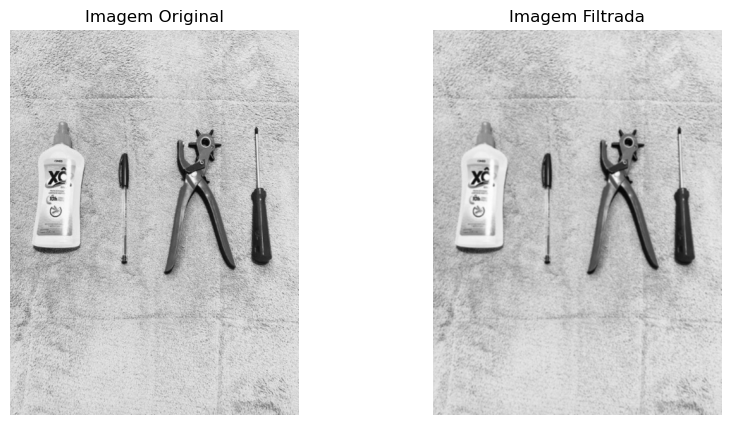

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Caminho das imagens
input_dir = './originalGrayDataset' #Pasta com as imagens originais
output_dir = './augmentedDataset/Filtro_da_media' #Pasta com as imagens filtradas

# Para certificar-se de que o diretório de saída existe
os.makedirs(output_dir, exist_ok=True)

# Obter todas as imagens do diretório de entrada
image_files = os.listdir(input_dir)

# Selecionar uma imagem aleatória para exibição
random_image = random.choice(image_files)

for image_file in image_files:
    # Caminho completo da imagem
    image_path = os.path.join(input_dir, image_file)
    
    # Carregar a imagem em escala de cinza
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Definir o kernel do filtro da média
    kernel = np.ones((3, 3), np.float32) / 9
    
    # Aplicar a convolução
    filtered_image = cv2.filter2D(image, -1, kernel)
    
    # Salvar a imagem filtrada
    filtered_image_path = os.path.join(output_dir,  image_file) #+'filtered_'
    cv2.imwrite(filtered_image_path, filtered_image)
    
    # Se a imagem for a selecionada aleatoriamente, armazenar as versões original e filtrada para exibição
    if image_file == random_image:
        original_image_to_show = image
        filtered_image_to_show = filtered_image

# Mostrar a imagem original e a imagem filtrada selecionadas aleatoriamente
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Imagem Original')
plt.imshow(original_image_to_show, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Imagem Filtrada')
plt.imshow(filtered_image_to_show, cmap='gray')
plt.axis('off')

plt.show()